# GPS Path-Finding and Counting Bikeshare Volumes

To reduce computing time with cloud computing, the code below was run in Google's Colaboratory to:
- map the GPS points to the map of Kelowna,
- calculate the paths using various path-finding models, 
- count the bikeshare trips along each street segment,
- calculate the percentage of street segments under the maximum realistic speed,
- calculate ADB estimates 
- export the shapefiles for each model

## The following blocks of code are required to install packages when running the code in Google Colaboratory

These are not needed if running the code in Jupyter Notebook. To install all the required dependencies, please see the **Tech Stack** document.

In [1]:
# follow this link to install osmnx dependancies: https://stackoverflow.com/questions/48293601/how-to-install-libspatialindex-on-google-collaboratory
!pip install osmnx

     |████████████████████████████████| 71kB 2.8MB/s 
     |████████████████████████████████| 901kB 7.4MB/s 
     |████████████████████████████████| 11.2MB 30.9MB/s 
     |████████████████████████████████| 17.9MB 29.2MB/s 
  Stored in directory: /root/.cache/pip/wheels/db/bf/bc/06a3e1bfe0ab27d2e720ceb3cff3159398d92644c0cec2c125
Successfully built munch


In [2]:
!pip show osmnx

Name: osmnx
Version: 0.10
Summary: Retrieve, model, analyze, and visualize OpenStreetMap street networks and other spatial data
Home-page: https://github.com/gboeing/osmnx
Author: Geoff Boeing
Author-email: g.boeing@northeastern.edu
License: MIT
Location: /usr/local/lib/python3.6/dist-packages
Requires: numpy, geopandas, matplotlib, Shapely, descartes, networkx, pandas, requests, Rtree
Required-by: 


In [3]:
!pip show pandas

Name: pandas
Version: 0.24.2
Summary: Powerful data structures for data analysis, time series, and statistics
Home-page: http://pandas.pydata.org
Author: None
Author-email: None
License: BSD
Location: /usr/local/lib/python3.6/dist-packages
Requires: pytz, numpy, python-dateutil
Required-by: xarray, vega-datasets, statsmodels, stable-baselines, sklearn-pandas, seaborn, pymc3, pandas-profiling, pandas-gbq, pandas-datareader, osmnx, mlxtend, magenta, gspread-dataframe, google-colab, geopandas, fix-yahoo-finance, featuretools, fbprophet, fastai, cufflinks, altair


In [0]:
!apt-get install -qq curl g++ make

In [5]:
!curl -L http://download.osgeo.org/libspatialindex/spatialindex-src-1.8.5.tar.gz | tar xz
import os
os.chdir('spatialindex-src-1.8.5')

  % Total    % Received % Xferd  Average Speed   Time    Time     Time  Current
                                 Dload  Upload   Total   Spent    Left  Speed
100  556k  100  556k    0     0   627k      0 --:--:-- --:--:-- --:--:--  626k


In [6]:
!./configure

checking build system type... x86_64-unknown-linux-gnu
checking for g++... g++
checking whether the C++ compiler works... yes
checking for C++ compiler default output file name... a.out
checking for suffix of executables... 
checking whether we are cross compiling... no
checking for suffix of object files... o
checking whether we are using the GNU C++ compiler... yes
checking whether g++ accepts -g... yes
checking how to run the C++ preprocessor... g++ -E
checking for a BSD-compatible install... /usr/bin/install -c
checking whether ln -s works... yes
checking whether make sets $(MAKE)... yes
checking host system type... x86_64-unknown-linux-gnu
checking how to print strings... printf
checking for gcc... gcc
checking whether we are using the GNU C compiler... yes
checking whether gcc accepts -g... yes
checking for gcc option to accept ISO C89... none needed
checking whether gcc understands -c and -o together... yes
checking for a sed that does not truncate output... /bin/sed
checking fo

In [7]:
!make

Making all in src
make[1]: Entering directory '/content/spatialindex-src-1.8.5/src'
Making all in storagemanager
make[2]: Entering directory '/content/spatialindex-src-1.8.5/src/storagemanager'
depbase=`echo Buffer.lo | sed 's|[^/]*$|.deps/&|;s|\.lo$||'`;\
/bin/bash ../../libtool  --tag=CXX   --mode=compile g++ -DPACKAGE_NAME=\"spatialindex\" -DPACKAGE_TARNAME=\"spatialindex-src\" -DPACKAGE_VERSION=\"1.8.5\" -DPACKAGE_STRING=\"spatialindex\ 1.8.5\" -DPACKAGE_BUGREPORT=\"mhadji@gmail.com\" -DPACKAGE_URL=\"\" -DSTDC_HEADERS=1 -DHAVE_SYS_TYPES_H=1 -DHAVE_SYS_STAT_H=1 -DHAVE_STDLIB_H=1 -DHAVE_STRING_H=1 -DHAVE_MEMORY_H=1 -DHAVE_STRINGS_H=1 -DHAVE_INTTYPES_H=1 -DHAVE_STDINT_H=1 -DHAVE_UNISTD_H=1 -DHAVE_DLFCN_H=1 -DLT_OBJDIR=\".libs/\" -DPACKAGE=\"spatialindex-src\" -DVERSION=\"1.8.5\" -DHAVE_FCNTL_H=1 -DHAVE_UNISTD_H=1 -DHAVE_SYS_TYPES_H=1 -DHAVE_SYS_STAT_H=1 -DHAVE_PTHREAD_H=1 -DHAVE_SYS_RESOURCE_H=1 -DHAVE_SYS_TIME_H=1 -DHAVE_STDINT_H=1 -DHAVE_FEATURES_H=1 -DHAVE_GETTIMEOFDAY=1 -DHAVE_MEM

In [8]:
!make install

Making install in src
make[1]: Entering directory '/content/spatialindex-src-1.8.5/src'
Making install in storagemanager
make[2]: Entering directory '/content/spatialindex-src-1.8.5/src/storagemanager'
make[3]: Entering directory '/content/spatialindex-src-1.8.5/src/storagemanager'
make[3]: Nothing to be done for 'install-exec-am'.
make[3]: Nothing to be done for 'install-data-am'.
make[3]: Leaving directory '/content/spatialindex-src-1.8.5/src/storagemanager'
make[2]: Leaving directory '/content/spatialindex-src-1.8.5/src/storagemanager'
Making install in spatialindex
make[2]: Entering directory '/content/spatialindex-src-1.8.5/src/spatialindex'
make[3]: Entering directory '/content/spatialindex-src-1.8.5/src/spatialindex'
make[3]: Nothing to be done for 'install-exec-am'.
make[3]: Nothing to be done for 'install-data-am'.
make[3]: Leaving directory '/content/spatialindex-src-1.8.5/src/spatialindex'
make[2]: Leaving directory '/content/spatialindex-src-1.8.5/src/spatialindex'
Making i

In [9]:
!pip install rtree

In [0]:
!ldconfig

## If running the code in Jupyter Notebook, start here after all the packages have been installed. 

The blocks below also need to be run if working in Jupyter Notebook.

In [0]:
from rtree import index
from rtree.index import Rtree

In [12]:
import matplotlib.cm as cm
import networkx as nx
import numpy as np
import osmnx as ox
import pandas as pd
%matplotlib inline
ox.config(log_console=True, use_cache=True)
ox.__version__

'0.10'

# Start reading files


### Read the point data set into Colaboratory

In [0]:
#run this section if you dont't have nearest points dataset

from google.colab import files

files.upload()

Saving Downtown_points_0611_0909_partly_clean.csv to Downtown_points_0611_0909_partly_clean.csv


(97110, 25)

### Once the file is loaded into Colaboratory or if working in Jupyter Notebook, load the file into Python

In [0]:
file = pd.read_csv("Downtown_points_0611_0909_partly_clean.csv")
file.shape

(97110, 25)

In [0]:
file = file.sort_values(by=['trip_id','pointtime']) # sort data
file['time']=pd.to_datetime(file['pointtime'])

file = file[['trip_id','time','lon','lat']] # keep only the required columns
file = file.reset_index(drop=True)
file['date'] = file['time'].dt.date

file.shape

(97110, 5)

In [0]:
#Total number of trips

print("Total number of trips: ", file.trip_id.nunique())

Total number of trips:  8853


How many trips do we have per day?

In [0]:
#Total number of trips per day
file.groupby(['date'])['trip_id'].nunique().reset_index().head(10)


,date,trip_id
0,2018-06-11,2
1,2018-06-12,11
2,2018-06-13,13
3,2018-06-14,19
4,2018-06-15,21
5,2018-06-16,67
6,2018-06-17,93
7,2018-06-18,42
8,2018-06-19,54
9,2018-06-20,49


# Find the nearest node and distance for each point

In [0]:
# get the street network for a place, and its area in square meters
ox.config(log_console=True, use_cache=True)

place = 'Kelowna, Canada'
gdf = ox.gdf_from_place(place)
area = ox.project_gdf(gdf).unary_union.area
G = ox.graph_from_place(place, network_type='all_private')


For closeness centrality, the centrality was calculated for downtown only, since most of the bikeshare data is there.



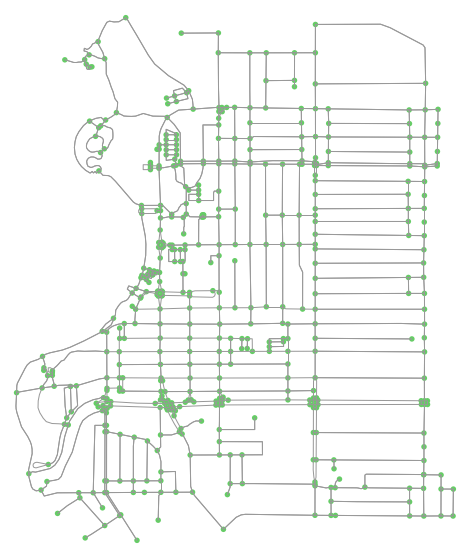

In [0]:
# define a point near the middle of downtown. We may need to adjust, but this seems good for now.
location_point = (49.88799, -119.49502)

# create network from point, inside bounding box of N, S, E, W each 1000m from point
G_dt = ox.graph_from_point(location_point, distance=1000, distance_type='bbox', network_type='all_private')
#G = ox.project_graph(G_dt)
fig, ax = ox.plot_graph(G_dt, fig_height = 10, node_size=30, node_color='#66cc66')

***If we don't want to work with the all data points, we can do sampling for 500 points***

In [0]:
df = file.sample(n=500)

,trip_id,time,lon,lat,date
72892,bf559890-eea8-413f-9cdd-6bb90f90ad33,2018-07-23 00:35:54,-119.498534,49.879683,2018-07-23


***If we want to work with the entire data, then run the below line***





In [0]:
df = file

***Below line will take long time to run (30 minutes with Cloud computing)!***

In [0]:
# return_dist = True return the distance between the nearest nod and original point, result will be a tuple

df['nearestNodes'] = df.apply(lambda x: ox.get_nearest_node(G, (x['lat'],x['lon']), return_dist = True), axis =1 )
df.head(2)

,trip_id,time,lon,lat,date,nearestNodes
0,0164057e-87e7-4ac4-9247-37ca43bfef15,2018-08-03 09:08:54.752,-119.493507,49.886151,2018-08-03,"(355377709, 17.4978517006164)"
1,0164057e-87e7-4ac4-9247-37ca43bfef15,2018-08-03 09:11:11.000,-119.493244,49.885430,2018-08-03,"(355377971, 19.758643719255314)"


Converitng tuple to columns

In [0]:
df['nearestNode'] = df['nearestNodes'].apply(lambda x : x[0])
df['distance'] = df['nearestNodes'].apply(lambda x : x[1])
df = df.drop('nearestNodes', axis = 1)
df.head(1)

,trip_id,time,lon,lat,date,nearestNode,distance
0,0164057e-87e7-4ac4-9247-37ca43bfef15,2018-08-03 09:08:54.752,-119.493507,49.886151,2018-08-03,355377709,17.497852


In [0]:
df['distance'].describe()

count    181.000000
mean      38.229591
std       29.907262
min        0.246132
25%       16.823250
50%       27.645481
75%       52.385219
max      148.871664
Name: distance, dtype: float64

We migh want to save the dataframe at this point for later analysis

In [0]:
from google.colab import files
df.to_csv('Downtown_points_0611_clean_with_nearestNode_dtonly.csv')
files.download('Downtown_points_0611_clean_with_nearestNode_dtonly.csv')


# If we have the nearset nodes csv file, we may upload it here

In [15]:
from google.colab import files

#Make sure there is not such a file in Colab directoy
!rm Downtown_points_0611_clean_with_nearestNode.csv
files.upload()



rm: cannot remove 'Downtown_points_0611_clean_with_nearestNode.csv': No such file or directory


Saving Downtown_points_0611_clean_with_nearestNode.csv to Downtown_points_0611_clean_with_nearestNode.csv


{'Downtown_points_0611_clean_with_nearestNode.csv': b',trip_id,time,lon,lat,date,nearestNode,distance\n0,00066e1e-ae6d-4d23-9fc3-69585c34100b,2018-07-29 19:53:25.692,-119.4730997,49.8861247,2018-07-29,356385965,62.49105090290621\n1,00066e1e-ae6d-4d23-9fc3-69585c34100b,2018-07-29 19:54:36.000,-119.4740514,49.8862368,2018-07-29,356385965,14.942168248695708\n2,00066e1e-ae6d-4d23-9fc3-69585c34100b,2018-07-29 20:04:19.908,-119.4766573,49.8856343,2018-07-29,1183815534,29.87933178988662\n3,0011fa6a-ba9c-4a10-a35d-1be8b961d1e6,2018-07-03 18:25:00.999,-119.4888912066102,49.886180900821685,2018-07-03,355377711,33.020055594761686\n4,0011fa6a-ba9c-4a10-a35d-1be8b961d1e6,2018-07-03 18:33:02.464,-119.49204673597636,49.88638335832111,2018-07-03,355378182,15.148082262076432\n5,0011fa6a-ba9c-4a10-a35d-1be8b961d1e6,2018-07-03 18:34:49.000,-119.49342674435437,49.886508147756594,2018-07-03,355377709,22.6730357357803\n6,0011fa6a-ba9c-4a10-a35d-1be8b961d1e6,2018-07-03 18:36:19.999,-119.49481882176629,49.886

Depends on which file we want to work, we can select downtown only or the other one (entire Kelown)

In [16]:
import pandas as pd
df = pd.read_csv("Downtown_points_0611_clean_with_nearestNode.csv")
#df = pd.read_csv("Downtown_points_0611_clean_with_nearestNode_dtonly.csv")
df.head(2)

,Unnamed: 0,trip_id,time,lon,lat,date,nearestNode,distance
0,0,00066e1e-ae6d-4d23-9fc3-69585c34100b,2018-07-29 19:53:25.692,-119.473100,49.886125,2018-07-29,356385965,62.491051
1,1,00066e1e-ae6d-4d23-9fc3-69585c34100b,2018-07-29 19:54:36.000,-119.474051,49.886237,2018-07-29,356385965,14.942168


## Cleaning points

***Replacing tricky nodes with the closest nodes***

In [0]:
dfc = df.replace({2367768106:2367768107,6504511184:2367768107,2727687891:2727687890,2727687886:2727687890, 2540866871:2367768262,1164495256:2367768262,2367768257:2367768251})

In [0]:
# remove points far than 150 m away of the nearest node in the graph
dfc = dfc[dfc['distance']<=150]

In [19]:
# How many trips remained in the data set
dfc.trip_id.nunique()

8852

In [20]:
# remove trips with less than 3 points
dfc = dfc.groupby('trip_id').filter(lambda x: x['trip_id'].count() >= 3) 
dfc.trip_id.nunique()

8815

In [0]:
dfc = dfc.drop(['Unnamed: 0'], axis=1).reset_index(drop=True)


In [22]:
df =dfc.copy()
df.distance.max()

149.95327603561816

In [23]:
import datetime
# rename column and convert string items to datatime objects

df=df.rename(columns={'nearestNode': 'nearest_node'})
df['time'] = pd.to_datetime(df['time'])
df.shape

(95905, 7)

# Path_finder algorithms

In [0]:
def getShortestPath(lst,path_type):
    points_list = lst.values.tolist()
    route = []
    #calculate the shortest route for list of points
    for point1, point2 in zip(points_list[:-1], points_list[1:]):
        orig = point1
        dest = point2
        try:
            intermediate_route = nx.shortest_path(G, orig, dest, weight=path_type)
            route.extend(intermediate_route[:-1]) #drop the endpoint of each intermediate route to not duplicate it (because it's also the start point of the next intermediate route)
         
        except:
            problem_trips.append(lst.name)
            #intermediate_route = [0,0]

    route.append(dest) # add the endpoint of the final intermediate route as it is the end of the route
    
    return route

## Shortest path

In [0]:
problem_trips = []

Route  = df.sort_values(by=['trip_id','time']).groupby('trip_id')['nearest_node'].apply(getShortestPath, 'length')


In [26]:
print('trips with problem: ', len(problem_trips))

trips with problem:  0


In [27]:
# remove trips with problem from point dataset
print("number of points before cleaning: ", df.trip_id.nunique())
df = df[~df['trip_id'].isin(problem_trips)]
print("number of points after cleaning: ",df.trip_id.nunique())

number of points before cleaning:  8815
number of points after cleaning:  8815


## Weighted_length path

In [0]:
#Run this block if you want to add weight to the edge attributes

nx.set_edge_attributes(G, 1, 'weightedlength')

        
for u,v,k,d in G.edges(keys=True, data=True):
    if d['highway']=='cycleway':
        G[u][v][0]['weightedlength'] = 0.5*(G[u][v][0]['length'])
    else:
        G[u][v][0]['weightedlength'] = G[u][v][0]['length']

# Ethel needs to be manually weighted as a cycleway.

G[355377955][1164495306][0]['weightedlength'] = 0.5*G[355377955][1164495306][0]['length']  #North side of Hwy
G[355378033][355377955][0]['weightedlength'] = 0.5*G[355378033][355377955][0]['length'] 
G[355378033][1183799280][0]['weightedlength'] = 0.5*G[355378033][1183799280][0]['length']
G[355377714][1183799280][0]['weightedlength'] = 0.5*G[355377714][1183799280][0]['length']
G[355377714][1173428940][0]['weightedlength'] = 0.5*G[355377714][1173428940][0]['length']
G[1173428940][356385928][0]['weightedlength'] = 0.5*G[1173428940][356385928][0]['length']
G[1173428958][356385928][0]['weightedlength'] = 0.5*G[1173428958][356385928][0]['length']
G[1173428958][356385918][0]['weightedlength'] = 0.5*G[1173428958][356385918][0]['length']
G[1169495461][356385918][0]['weightedlength'] = 0.5*G[1169495461][356385918][0]['length']
G[1169495461][356385900][0]['weightedlength'] = 0.5*G[1169495461][356385900][0]['length']
G[1169495520][356385900][0]['weightedlength'] = 0.5*G[1169495520][356385900][0]['length']
G[1169495520][356385884][0]['weightedlength'] = 0.5*G[1169495520][356385884][0]['length']
G[1169495512][356385884][0]['weightedlength'] = 0.5*G[1169495512][356385884][0]['length']
G[1169495512][356386101][0]['weightedlength'] = 0.5*G[1169495512][356386101][0]['length']
G[355378111][356386101][0]['weightedlength'] = 0.5*G[355378111][356386101][0]['length']
G[355378826][1764608698][0]['weightedlength'] = 0.5*G[355378826][1764608698][0]['length']
G[355378826][355378130][0]['weightedlength'] = 0.5*G[355378826][355378130][0]['length']  # South of Clement
G[356387340][32687260][0]['weightedlength'] = 0.5*G[356387340][32687260][0]['length'] # South side of Hwy
G[356387340][32687259][0]['weightedlength'] = 0.5*G[356387340][32687259][0]['length']
G[356387347][32687259][0]['weightedlength'] = 0.5*G[356387347][32687259][0]['length']
G[3397776724][356387347][0]['weightedlength'] = 0.5*G[3397776724][356387347][0]['length']
G[356387355][356387302][0]['weightedlength'] = 0.5*G[356387355][356387302][0]['length']
G[355384801][356387355][0]['weightedlength'] = 0.5*G[355384801][356387355][0]['length']  #North side of Sutherland

In [0]:
problem_trips = []

Route  = df.sort_values(by=['trip_id','time']).groupby('trip_id')['nearest_node'].apply(getShortestPath, 'weightedlength')


In [0]:
print('trips with problem: ', len(problem_trips))

# remove trips with problem from point dataset
print("number of points before cleaning: ", df.trip_id.nunique())
df = df[~df['trip_id'].isin(problem_trips)]
print("number of points after cleaning: ",df.trip_id.nunique())

trips with problem:  0
number of points before cleaning:  8815
number of points after cleaning:  8815


## Centrality

For closeness centrality, the centrality was calculated for downtown only, since most of the bikeshare data is there.

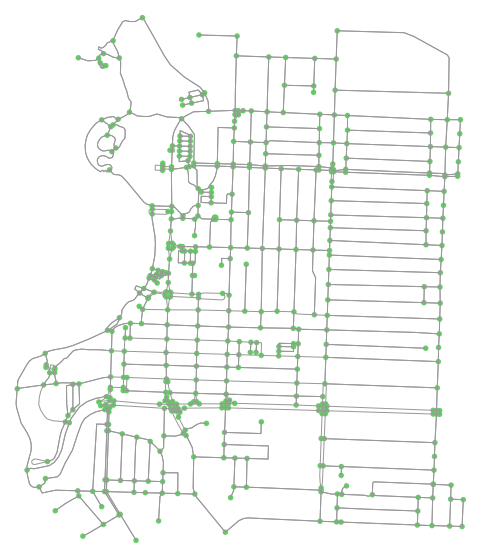

In [0]:
# define a point near the middle of downtown. We may need to adjust, but this seems good for now.
location_point = (49.88799, -119.49502)

# create network from point, inside bounding box of N, S, E, W each 1000m from point
G_dt = ox.graph_from_point(location_point, distance=1000, distance_type='bbox', network_type='all_private')
G_dt = ox.project_graph(G_dt)
fig, ax = ox.plot_graph(G_dt, fig_height = 10, node_size=30, node_color='#66cc66')

In [0]:
# depends on what kind of centrality we want to add, we may run one of two below lines:

#edge_centrality = nx.betweenness_centrality(nx.line_graph(G_dt)) # run this line if you don't have betweenness centrality
edge_centrality = nx.closeness_centrality(nx.line_graph(G_dt)) # run this line if you don't have closeness centrality


Reverse centrality attribute to make it compatible with the shortest path algorithm

Run below code just once!


In [0]:
values = []
for key, val in edge_centrality.items():
  values.append(val)
  

for key, val in edge_centrality.items():
  edge_centrality[key] = 1 - val

In [0]:
max(values)

0.09676071011721456

In [0]:
#set centrality attribute
nx.set_edge_attributes(G_dt, edge_centrality, 'centrality')
ox.graph_to_gdfs(G_dt, nodes=False).columns

Index(['access', 'bridge', 'centrality', 'geometry', 'highway', 'junction',
       'key', 'lanes', 'length', 'maxspeed', 'name', 'oneway', 'osmid', 'ref',
       'service', 'tunnel', 'u', 'v', 'width'],
      dtype='object')

In [0]:
def getShortestPath_dt(lst,path_type):
    #print(lst)
    points_list = lst.values.tolist()
    route = []
    #calculate the shortest route for list of points
    for point1, point2 in zip(points_list[:-1], points_list[1:]):
        orig = point1
        dest = point2
        try:
            intermediate_route = nx.shortest_path(G_dt, orig, dest, weight=path_type)
            route.extend(intermediate_route[:-1]) #drop the endpoint of each intermediate route to not duplicate it (because it's also the start point of the next intermediate route)
         
        except:
            problem_trips.append(lst.name)
            #intermediate_route = [0,0]

    route.append(dest) # add the endpoint of the final intermediate route as it is the end of the route
    
    return route



problem_trips = []

Route  = df.sort_values(by=['trip_id','time']).groupby('trip_id')['nearest_node'].apply(getShortestPath_dt, 'centrality')


In [0]:
print('trips with problem: ', len(problem_trips))

# remove trips with problem from point dataset
print("number of points before cleaning: ", df.trip_id.nunique())
df = df[~df['trip_id'].isin(problem_trips)]
print("number of points after cleaning: ",df.trip_id.nunique())

trips with problem:  0
number of points before cleaning:  7067
number of points after cleaning:  7067


## Preferred path

In [0]:
# Add 'pathpref' as an attribute and initially set everything as ‘1’

nx.set_edge_attributes(G, 1, 'pathpref')

# Then set preference values, depending on the highway type.

for u,v,k,d in G.edges(keys=True, data=True):
    if d['highway']=='cycleway':
        G[u][v][0]['pathpref'] = 0.5
    elif d['highway']=='residential':
        G[u][v][0]['pathpref'] = 0.9
    elif d['highway']=='secondary':
        G[u][v][0]['pathpref'] = 1.2
    elif d['highway']=='tertiary':
        G[u][v][0]['pathpref'] = 1.2
    elif d['highway']=='trunk':
        G[u][v][0]['pathpref'] = 3.0
    else:
        G[u][v][0]['pathpref'] = 1.0


# Ethel needs to be manually weighted as a cycleway.

G[355377955][1164495306][0]['pathpref'] = 0.5  #North side of Hwy
G[355378033][355377955][0]['pathpref'] = 0.5
G[355378033][1183799280][0]['pathpref'] = 0.5
G[355377714][1183799280][0]['pathpref'] = 0.5
G[355377714][1173428940][0]['pathpref'] = 0.5
G[1173428940][356385928][0]['pathpref'] = 0.5
G[1173428958][356385928][0]['pathpref'] = 0.5
G[1173428958][356385918][0]['pathpref'] = 0.5
G[1169495461][356385918][0]['pathpref'] = 0.5
G[1169495461][356385900][0]['pathpref'] = 0.5
G[1169495520][356385900][0]['pathpref'] = 0.5
G[1169495520][356385884][0]['pathpref'] = 0.5
G[1169495512][356385884][0]['pathpref'] = 0.5
G[1169495512][356386101][0]['pathpref'] = 0.5
G[355378111][356386101][0]['pathpref'] = 0.5
G[355378826][1764608698][0]['pathpref'] = 0.5
G[355378826][355378130][0]['pathpref'] = 0.5  # South of Clement
G[356387340][32687260][0]['pathpref'] = 0.5 # South side of Hwy
G[356387340][32687259][0]['pathpref'] = 0.5
G[356387347][32687259][0]['pathpref'] = 0.5
G[3397776724][356387347][0]['pathpref'] = 0.5
G[356387355][356387302][0]['pathpref'] = 0.5
G[355384801][356387355][0]['pathpref'] = 0.5  #North side of Sutherland

In [0]:
problem_trips = []

Route  = df.sort_values(by=['trip_id','time']).groupby('trip_id')['nearest_node'].apply(getShortestPath, 'pathpref')


In [0]:
print('trips with problem: ', len(problem_trips))

# remove trips with problem from point dataset
print("number of points before cleaning: ", df.trip_id.nunique())
df = df[~df['trip_id'].isin(problem_trips)]
print("number of points after cleaning: ",df.trip_id.nunique())

trips with problem:  0
number of points before cleaning:  8815
number of points after cleaning:  8815


## Simplified preferred path

In [0]:
nx.set_edge_attributes(G, 1, 'cycleweight')

for u,v,k,d in G.edges(keys=True, data=True):
    if d['highway']=='cycleway':
        G[u][v][0]['cycleweight'] = 0.5
        

# Ethel needs to be manually weighted as a cycleway.

G[355377955][1164495306][0]['cycleweight'] = 0.5  #North side of Hwy
G[355378033][355377955][0]['cycleweight'] = 0.5
G[355378033][1183799280][0]['cycleweight'] = 0.5
G[355377714][1183799280][0]['cycleweight'] = 0.5
G[355377714][1173428940][0]['cycleweight'] = 0.5
G[1173428940][356385928][0]['cycleweight'] = 0.5
G[1173428958][356385928][0]['cycleweight'] = 0.5
G[1173428958][356385918][0]['cycleweight'] = 0.5
G[1169495461][356385918][0]['cycleweight'] = 0.5
G[1169495461][356385900][0]['cycleweight'] = 0.5
G[1169495520][356385900][0]['cycleweight'] = 0.5
G[1169495520][356385884][0]['cycleweight'] = 0.5
G[1169495512][356385884][0]['cycleweight'] = 0.5
G[1169495512][356386101][0]['cycleweight'] = 0.5
G[355378111][356386101][0]['cycleweight'] = 0.5
G[355378826][1764608698][0]['cycleweight'] = 0.5
G[355378826][355378130][0]['cycleweight'] = 0.5  # South of Clement
G[356387340][32687260][0]['cycleweight'] = 0.5 # South side of Hwy
G[356387340][32687259][0]['cycleweight'] = 0.5
G[356387347][32687259][0]['cycleweight'] = 0.5
G[3397776724][356387347][0]['cycleweight'] = 0.5
G[356387355][356387302][0]['cycleweight'] = 0.5
G[355384801][356387355][0]['cycleweight'] = 0.5  #North side of Sutherland

In [0]:
problem_trips = []

Route  = df.sort_values(by=['trip_id','time']).groupby('trip_id')['nearest_node'].apply(getShortestPath, 'cycleweight')


In [0]:
print('trips with problem: ', len(problem_trips))

# remove trips with problem from point dataset
print("number of points before cleaning: ", df.trip_id.nunique())
df = df[~df['trip_id'].isin(problem_trips)]
print("number of points after cleaning: ",df.trip_id.nunique())

trips with problem:  0
number of points before cleaning:  8815
number of points after cleaning:  8815


## Corner_weighted path

In [0]:
# Add 'corner' as an attribute and initially set everything as '1'

nx.set_edge_attributes(G, 1, 'corner')

# Ethel Street. Proportion of counter = 0.14. Inverse = 1-0.14 = 0.86 and increased from there.
G[355377955][1164495306][0]['corner'] = 0.95  #North side of Hwy
G[355378033][355377955][0]['corner'] = 0.95
G[355378033][1183799280][0]['corner'] = 0.95
G[355377714][1183799280][0]['corner'] = 0.95
G[355377714][1173428940][0]['corner'] = 0.95
G[1173428940][356385928][0]['corner'] = 0.95
G[1173428958][356385928][0]['corner'] = 0.95
G[1173428958][356385918][0]['corner'] = 0.95
G[1169495461][356385918][0]['corner'] = 0.95
G[1169495461][356385900][0]['corner'] = 0.95
G[1169495520][356385900][0]['corner'] = 0.95
G[1169495520][356385884][0]['corner'] = 0.95
G[1169495512][356385884][0]['corner'] = 0.95
G[1169495512][356386101][0]['corner'] = 0.95
G[355378111][356386101][0]['corner'] = 0.95
G[355378826][1764608698][0]['corner'] = 0.95
G[355378826][355378130][0]['corner'] = 0.95  # South of Clement
G[356387340][32687260][0]['corner'] = 0.95 # South side of Hwy
G[356387340][32687259][0]['corner'] = 0.95
G[356387347][32687259][0]['corner'] = 0.95
G[3397776724][356387347][0]['corner'] = 0.95
G[356387355][356387302][0]['corner'] = 0.95
G[355384801][356387355][0]['corner'] = 0.95  #North side of Sutherland

# Cawston Street. Proportion of counter = 0.28. Inverse = 1-0.28 = 0.72  and decreased from there.
# Cycleway
G[1764608712][1764608705][0]['corner'] = 0.005  #Cawston at Gordon
G[1764608712][1764608707][0]['corner'] = 0.005
G[1764608707][1764608698][0]['corner'] = 0.005 
G[1764608702][1764608698][0]['corner'] = 0.005 #Cawston at Ethel
G[1764608716][1764608702][0]['corner'] = 0.005 
G[3104269037][1764608716][0]['corner'] = 0.005 
G[3104269037][1764608718][0]['corner'] = 0.005
G[1764608750][1764608718][0]['corner'] = 0.005 
G[1764608750][1764608748][0]['corner'] = 0.005 
G[1764608748][1764608721][0]['corner'] = 0.005 
G[1545344532][1764608721][0]['corner'] = 0.005 
G[1545344532][2367768354][0]['corner'] = 0.005 
G[2367768354][2367768353][0]['corner'] = 0.005 #Cawston at Prospera Place
# Road
G[355378853][355378094][0]['corner'] = 0.005  #Cawston at Gordon
G[355378853][1169495600][0]['corner'] = 0.005
G[355378111][1169495600][0]['corner'] = 0.005
G[355378111][1169495557][0]['corner'] = 0.005 #Cawston at Ethel
G[1169495560][1169495557][0]['corner'] = 0.005 
G[355378103][1169495560][0]['corner'] = 0.005 
G[355378103][3104269038][0]['corner'] = 0.005 
G[355378029][3104269038][0]['corner'] = 0.005 # Intersection at Richter
G[355378029][1169495474][0]['corner'] = 0.005 
G[4776302839][1169495474][0]['corner'] = 0.005 
G[355378210][4776302839][0]['corner'] = 0.005 
G[355378210][1173428923][0]['corner'] = 0.005 
G[355378217][1173428923][0]['corner'] = 0.005 
G[355378217][1173428766][0]['corner'] = 0.005 
G[355378024][1173428766][0]['corner'] = 0.005 
G[355378024][1416086535][0]['corner'] = 0.005 
G[355378021][1416086535][0]['corner'] = 0.005 #Cawston at Prospera Place
# Waterfront. Proportion of counter = 0.17. Inverse = 1-0.17 = 0.83 and increased from there.
G[1182749614][1182749506][0]['corner'] = 2.75  # At Sunset Blvd.
G[1182749614][1182749609][0]['corner'] = 2.75
G[1182749609][1182749369][0]['corner'] = 2.75
G[1182749369][1416086918][0]['corner'] = 2.75
G[1416086918][1416086896][0]['corner'] = 2.75
G[2367768348][1416086896][0]['corner'] = 2.75
G[1182749550][2367768348][0]['corner'] = 2.75   
G[1182749550][4721525081][0]['corner'] = 2.75   
G[4721525081][4721525080][0]['corner'] = 2.75 # At Yacht Club North end
# City Park. Proportion of counter = 0.41. Inverse = 1-0.41 = 0.59 and increased from there.
G[4721525083][4721525080][0]['corner'] = 2.25  # At Yacht Club
G[4721525083][4721525075][0]['corner'] = 2.25
G[4721525082][4721525075][0]['corner'] = 2.25
G[4776302837][4721525082][0]['corner'] = 2.25
G[4776302837][4776302834][0]['corner'] = 2.25
G[4776302834][2367768318][0]['corner'] = 2.25
G[2367768318][4721525084][0]['corner'] = 2.25  # Lake side of Ogopogo
G[3692640555][4721525084][0]['corner'] = 2.25
G[3692640555][1182749220][0]['corner'] = 2.25
G[1182749220][2367768212][0]['corner'] = 2.25
G[1416085141][2367768212][0]['corner'] = 2.25 # At tunnel

In [0]:
problem_trips = []

Route  = df.sort_values(by=['trip_id','time']).groupby('trip_id')['nearest_node'].apply(getShortestPath, 'corner')


In [0]:
print('trips with problem: ', len(problem_trips))

# remove trips with problem from point dataset
print("number of points before cleaning: ", df.trip_id.nunique())
df = df[~df['trip_id'].isin(problem_trips)]
print("number of points after cleaning: ",df.trip_id.nunique())

trips with problem:  0
number of points before cleaning:  8815
number of points after cleaning:  8815


## Corner_weighted_length path

In [0]:
# Add 'corner_wl' as an attribute and initially set everything as '1'

nx.set_edge_attributes(G, 1, 'corner_wl')

# Ethel Street. Proportion of counter = 0.14. Inverse = 1-0.14 = 0.86 and increased from there.
G[355377955][1164495306][0]['corner_wl'] = 0.95*G[355377955][1164495306][0]['length']  #North side of Hwy
G[355378033][355377955][0]['corner_wl'] = 0.95*G[355378033][355377955][0]['length']
G[355378033][1183799280][0]['corner_wl'] = 0.95*G[355378033][1183799280][0]['length']
G[355377714][1183799280][0]['corner_wl'] = 0.95*G[355377714][1183799280][0]['length']
G[355377714][1173428940][0]['corner_wl'] = 0.95*G[355377714][1173428940][0]['length']
G[1173428940][356385928][0]['corner_wl'] = 0.95*G[1173428940][356385928][0]['length']
G[1173428958][356385928][0]['corner_wl'] = 0.95*G[1173428958][356385928][0]['length']
G[1173428958][356385918][0]['corner_wl'] = 0.95*G[1173428958][356385918][0]['length']
G[1169495461][356385918][0]['corner_wl'] = 0.95*G[1169495461][356385918][0]['length']
G[1169495461][356385900][0]['corner_wl'] = 0.95*G[1169495461][356385900][0]['length']
G[1169495520][356385900][0]['corner_wl'] = 0.95*G[1169495520][356385900][0]['length']
G[1169495520][356385884][0]['corner_wl'] = 0.95*G[1169495520][356385884][0]['length']
G[1169495512][356385884][0]['corner_wl'] = 0.95*G[1169495512][356385884][0]['length']
G[1169495512][356386101][0]['corner_wl'] = 0.95*G[1169495512][356386101][0]['length']
G[355378111][356386101][0]['corner_wl'] = 0.95*G[355378111][356386101][0]['length']
G[355378826][1764608698][0]['corner_wl'] = 0.95*G[355378826][1764608698][0]['length']
G[355378826][355378130][0]['corner_wl'] = 0.95*G[355378826][355378130][0]['length'] # South of Clement
G[356387340][32687260][0]['corner_wl'] = 0.95*G[356387340][32687260][0]['length']  #South side of Hwy
G[356387340][32687259][0]['corner_wl'] = 0.95*G[356387340][32687259][0]['length'] 
G[356387347][32687259][0]['corner_wl'] = 0.95*G[356387347][32687259][0]['length'] 
G[3397776724][356387347][0]['corner_wl'] = 0.95*G[3397776724][356387347][0]['length']
G[356387355][356387302][0]['corner_wl'] = 0.95*G[356387355][356387302][0]['length']
G[355384801][356387355][0]['corner_wl'] = 0.95*G[355384801][356387355][0]['length'] #North side of Sutherland

# Cawston Street. Proportion of counter = 0.28. Inverse = 1-0.28 = 0.72  and decreased from there.
# Cycleway
G[1764608712][1764608705][0]['corner_wl'] = 0.005*G[1764608712][1764608705][0]['length']  #Cawston at Gordon
G[1764608712][1764608707][0]['corner_wl'] = 0.005*G[1764608712][1764608707][0]['length']
G[1764608707][1764608698][0]['corner_wl'] = 0.005*G[1764608707][1764608698][0]['length'] 
G[1764608702][1764608698][0]['corner_wl'] = 0.005*G[1764608702][1764608698][0]['length'] #Cawston at Ethel
G[1764608716][1764608702][0]['corner_wl'] = 0.005*G[1764608716][1764608702][0]['length'] 
G[3104269037][1764608716][0]['corner_wl'] = 0.005*G[3104269037][1764608716][0]['length'] 
G[3104269037][1764608718][0]['corner_wl'] = 0.005*G[3104269037][1764608718][0]['length']
G[1764608750][1764608718][0]['corner_wl'] = 0.005*G[1764608750][1764608718][0]['length'] 
G[1764608750][1764608748][0]['corner_wl'] = 0.005*G[1764608750][1764608748][0]['length'] 
G[1764608748][1764608721][0]['corner_wl'] = 0.005*G[1764608748][1764608721][0]['length'] 
G[1545344532][1764608721][0]['corner_wl'] = 0.005*G[1545344532][1764608721][0]['length'] 
G[1545344532][2367768354][0]['corner_wl'] = 0.005*G[1545344532][2367768354][0]['length'] 
G[2367768354][2367768353][0]['corner_wl'] = 0.005*G[2367768354][2367768353][0]['length'] #Cawston at Prospera Place
# Road
G[355378853][355378094][0]['corner_wl']  = 0.005*G[355378853][355378094][0]['length']   #Cawston at Gordon
G[355378853][1169495600][0]['corner_wl'] = 0.005*G[355378853][1169495600][0]['length']
G[355378111][1169495600][0]['corner_wl'] = 0.005*G[355378111][1169495600][0]['length']
G[355378111][1169495557][0]['corner_wl'] = 0.005*G[355378111][1169495557][0]['length'] #Cawston at Ethel
G[1169495560][1169495557][0]['corner_wl'] = 0.005*G[1169495560][1169495557][0]['length']
G[355378103][1169495560][0]['corner_wl'] = 0.005*G[355378103][1169495560][0]['length'] 
G[355378103][3104269038][0]['corner_wl'] = 0.005*G[355378103][3104269038][0]['length'] 
G[355378029][3104269038][0]['corner_wl'] = 0.005*G[355378029][3104269038][0]['length'] # Intersection at Richter
G[355378029][1169495474][0]['corner_wl'] = 0.005*G[355378029][1169495474][0]['length'] 
G[4776302839][1169495474][0]['corner_wl'] = 0.005*G[4776302839][1169495474][0]['length']
G[355378210][4776302839][0]['corner_wl'] = 0.005*G[355378210][4776302839][0]['length'] 
G[355378210][1173428923][0]['corner_wl'] = 0.005*G[355378210][1173428923][0]['length'] 
G[355378217][1173428923][0]['corner_wl'] = 0.005*G[355378217][1173428923][0]['length'] 
G[355378217][1173428766][0]['corner_wl'] = 0.005*G[355378217][1173428766][0]['length'] 
G[355378024][1173428766][0]['corner_wl'] = 0.005*G[355378024][1173428766][0]['length'] 
G[355378024][1416086535][0]['corner_wl'] = 0.005*G[355378024][1416086535][0]['length'] 
G[355378021][1416086535][0]['corner_wl'] = 0.005*G[355378021][1416086535][0]['length'] #Cawston at Prospera Place
# Waterfront. Proportion of counter = 0.17. Inverse = 1-0.17 = 0.83 and increased from there.
G[1182749614][1182749506][0]['corner_wl'] = 2.75*G[1182749614][1182749506][0]['length']  # At Sunset Blvd.
G[1182749614][1182749609][0]['corner_wl'] = 2.75*G[1182749614][1182749609][0]['length']
G[1182749609][1182749369][0]['corner_wl'] = 2.75*G[1182749609][1182749369][0]['length']
G[1182749369][1416086918][0]['corner_wl'] = 2.75*G[1182749369][1416086918][0]['length']
G[1416086918][1416086896][0]['corner_wl'] = 2.75*G[1416086918][1416086896][0]['length']
G[2367768348][1416086896][0]['corner_wl'] = 2.75*G[2367768348][1416086896][0]['length']
G[1182749550][2367768348][0]['corner_wl'] = 2.75*G[1182749550][2367768348][0]['length']   
G[1182749550][4721525081][0]['corner_wl'] = 2.75*G[1182749550][4721525081][0]['length']   
G[4721525081][4721525080][0]['corner_wl'] = 2.75*G[4721525081][4721525080][0]['length'] # At Yacht Club North end
# City Park. Proportion of counter = 0.41. Inverse = 1-0.41 = 0.59 and increased from there.
G[4721525083][4721525080][0]['corner_wl'] = 2.25*G[4721525083][4721525080][0]['length']  # At Yacht Club
G[4721525083][4721525075][0]['corner_wl'] = 2.25*G[4721525083][4721525075][0]['length']
G[4721525082][4721525075][0]['corner_wl'] = 2.25*G[4721525082][4721525075][0]['length']
G[4776302837][4721525082][0]['corner_wl'] = 2.25*G[4776302837][4721525082][0]['length']
G[4776302837][4776302834][0]['corner_wl'] = 2.25*G[4776302837][4776302834][0]['length']
G[4776302834][2367768318][0]['corner_wl'] = 2.25*G[4776302834][2367768318][0]['length']
G[2367768318][4721525084][0]['corner_wl'] = 2.25*G[2367768318][4721525084][0]['length']  # Lake side of Ogopogo
G[3692640555][4721525084][0]['corner_wl'] = 2.25*G[3692640555][4721525084][0]['length']
G[3692640555][1182749220][0]['corner_wl'] = 2.25*G[3692640555][1182749220][0]['length']
G[1182749220][2367768212][0]['corner_wl'] = 2.25*G[1182749220][2367768212][0]['length']
G[1416085141][2367768212][0]['corner_wl'] = 2.25*G[1416085141][2367768212][0]['length'] # At tunnel

In [0]:
problem_trips = []

Route  = df.sort_values(by=['trip_id','time']).groupby('trip_id')['nearest_node'].apply(getShortestPath, 'corner_wl')


In [0]:
print('trips with problem: ', len(problem_trips))

# remove trips with problem from point dataset
print("number of points before cleaning: ", df.trip_id.nunique())
df = df[~df['trip_id'].isin(problem_trips)]
print("number of points after cleaning: ",df.trip_id.nunique())

trips with problem:  0
number of points before cleaning:  8815
number of points after cleaning:  8815


## Unbiased path

In [0]:
# set all road semgments to 1

nx.set_edge_attributes(G, 1, 'unbiased_length')


In [0]:
problem_trips = []

Route  = df.sort_values(by=['trip_id','time']).groupby('trip_id')['nearest_node'].apply(getShortestPath, 'unbiased_length')


In [0]:
print('trips with problem: ', len(problem_trips))

# remove trips with problem from point dataset
print("number of points before cleaning: ", df.trip_id.nunique())
df = df[~df['trip_id'].isin(problem_trips)]
print("number of points after cleaning: ",df.trip_id.nunique())

trips with problem:  0
number of points before cleaning:  8815
number of points after cleaning:  8815




---



***Create a csv file of trips with problem (if there is any)***

In [0]:
pdf = df[df['trip_id'].isin(problem_trips)].reset_index(drop = True).drop(['Unnamed: 0'], axis=1)
pdf['trip_id'].nunique()

In [0]:
from google.colab import files
pdf.to_csv('trips_with_problem.csv')
files.download('trips_with_problem.csv')


# create shapefile

***Removing trips with problem (if there is any) from routes data***





In [0]:
# route is an object. We should convert it to a dataFrame
routes = pd.DataFrame({'trip_id':Route.index, 'route':Route.values})
df_clean =routes[~routes['trip_id'].isin(problem_trips)]
routes = df_clean.copy()

***Create a dataframe with start and end time for each trip***

In [0]:
startTime = df.sort_values(by=['trip_id','time']).groupby('trip_id')['time'].apply(lambda x:min(x))
endTime = df.sort_values(by=['trip_id','time']).groupby('trip_id')['time'].apply(lambda x:max(x))

# startTime and endTime are objects. We should convert them to dataFrame

st = pd.DataFrame({'trip_id':startTime.index, 'start_time':startTime.values})
et = pd.DataFrame({'trip_id':endTime.index, 'end_time':endTime.values})
df2 = pd.merge(st, et, left_on='trip_id', right_on='trip_id', how='inner')

routes = pd.merge(routes, df2, left_on='trip_id', right_on='trip_id', how='inner')
routes.head(1)

,trip_id,route,start_time,end_time
0,00066e1e-ae6d-4d23-9fc3-69585c34100b,"[356385965, 3101157914, 4003592529, 3101157923...",2018-07-29 19:53:25.692,2018-07-29 20:04:19.908


In [0]:
# make sure start_time and end_time are datetime objects

routes['start_time'] = pd.to_datetime(routes['start_time'])
routes['end_time'] = pd.to_datetime(routes['end_time'])

In [0]:
from geopandas import GeoDataFrame
from shapely.geometry import Point, LineString

#Create edges dataframe

def getEdge(route_list):
    edge = []
    for point1, point2 in zip(route_list[:-1], route_list[1:]):
        intermediate_edge = (point1,point2)
        edge.append(intermediate_edge)
    return edge

routes['edge'] = routes['route'].apply(getEdge)
routes.head(2)

,trip_id,route,start_time,end_time,edge
0,00066e1e-ae6d-4d23-9fc3-69585c34100b,"[356385965, 3101157914, 4003592529, 3101157923...",2018-07-29 19:53:25.692,2018-07-29 20:04:19.908,"[(356385965, 3101157914), (3101157914, 4003592..."
1,0011fa6a-ba9c-4a10-a35d-1be8b961d1e6,"[355377711, 355378135, 355378153, 355378182, 3...",2018-07-03 18:25:00.999,2018-07-03 18:38:03.603,"[(355377711, 355378135), (355378135, 355378153..."


In [0]:
flattend_list = [val for sublist in routes.edge.tolist() for val in sublist]
edges = pd.DataFrame(flattend_list, columns = ['origin', 'des'])
edges.head()

,origin,des
0,356385965,3101157914
1,3101157914,4003592529
2,4003592529,3101157923
3,3101157923,3101157917
4,3101157917,355377716


In [0]:

edges['pairNode'] = edges.apply(lambda x:(x['origin'], x['des']), axis = 1)
edges.head(2)

,origin,des,pairNode
0,356385965,3101157914,"(356385965, 3101157914)"
1,3101157914,4003592529,"(3101157914, 4003592529)"


***Count number of edges***

In [0]:
edges['pairNode'] = edges.pairNode.apply(lambda x:tuple(sorted(x)))
#edges.head()
pair= pd.DataFrame(edges.groupby('pairNode').size()).reset_index().rename(columns={0:'Count'})
pair.head()

,pairNode,Count
0,"(32687232, 4711639008)",203
1,"(32687232, 4711639011)",29
2,"(32687232, 4711639018)",223
3,"(32687236, 774220300)",47
4,"(32687236, 775402860)",194


In [0]:
pair.Count.min()

1

Jut to see how many trips passing City Park Counter which is located between these two nodes: (2367768212,1416085141)

In [0]:
pair[pair['pairNode']==(2367768212,1416085141)]


,pairNode,Count


In [0]:
pair[pair['pairNode']==(1416085141,2367768212)]


,pairNode,Count
2305,"(1416085141, 2367768212)",1097


In [0]:
#adding two columns to have origin and destination points
pair['fromNode'] = pair['pairNode'].map(lambda x: x[0])
pair['ToNode'] = pair['pairNode'].map(lambda x: x[1])
pair.head(3)

,pairNode,Count,fromNode,ToNode
0,"(32687232, 4711639008)",203,32687232,4711639008
1,"(32687232, 4711639011)",29,32687232,4711639011
2,"(32687232, 4711639018)",223,32687232,4711639018


### Add ADB

Depends on which algorithm you are working uncomment the lines below

In [0]:
# From Mixed Effects Model on Shortest Length path-finding model:

import numpy as np

pair['ADB'] = pair['Count'].apply(lambda x:round(np.exp(0.02717094*(x/91)+6.325313)))

In [ ]:
# Adding ADB by using optimization solution
# We should multiply total count with 1.748 to get ADB

pair['ADB'] = pair['Count'].apply(lambda x:round(1.748*x))

In [0]:
G = ox.project_graph(G)

#For centrality algorithm the below line needs to be run 
#G=ox.project_graph(G_dt)

In [0]:
# look at the current attributes

edge_attributes = ox.graph_to_gdfs(G, nodes=False).columns
edge_attributes

Index(['access', 'bridge', 'corner', 'geometry', 'highway', 'junction', 'key',
       'lanes', 'length', 'maxspeed', 'name', 'oneway', 'osmid', 'ref',
       'service', 'tunnel', 'u', 'v', 'width'],
      dtype='object')

In [0]:
# Add the count values to each edge

for index,row in pair.iterrows():
    try:
        G[row['fromNode']][row['ToNode']][0]['Count'] = int(row['Count'])
    except:
        #print(row['fromNode'],row['ToNode'],row['Count'])
        G[row['ToNode']][row['fromNode']][0]['Count'] = int(row['Count'])
        
    #print (type(row['fromNode']),type(row['ToNode']),row['Count'] )

check if we have the same value for Count attribute for City Park nodes in Graph G

In [0]:
 G[1416085141][2367768212][0]['Count']

1097

**Add ADB attribute to the graph**

In [0]:
for index,row in pair.iterrows():
    try:
        G[row['fromNode']][row['ToNode']][0]['ADB'] = int(row['ADB'])
    except:
        G[row['ToNode']][row['fromNode']][0]['ADB'] = int(row['ADB'])

In [0]:
 G[1416085141][2367768212][0]['ADB']

662

In [0]:
# removing previous shapefiles in the G_with_count folder
!rm -rf G_with_count

In [0]:
# create a shapefile
ox.save_graph_shapefile(G, filename = 'G_with_count')


If using Colaboratory, shapefiles can be downloaded from 
content/spatialindex-src-1.8.5/data/G_with_count/edges/edges.cpg

# How many trips from bikeshare data crossing each counter

In [0]:
#reading counter information
fp = files.upload()
loca = pd.read_csv("Counter_Locations.csv", encoding='utf-8-sig')

Saving Counter_Locations.csv to Counter_Locations.csv


In [0]:
loca['Node1'] = loca['Node1'].astype(float) 
loca['Node2'] = loca['Node2'].astype(float) 

#adding date into the routes dataframe
routes['date'] = routes['start_time'].dt.date

def counter(lst):
    lst = lst['route']
    count = 0
    if lst.count(point[0]) and lst.count(point[1]):
        for i in range (len(lst)-1):
            if ( lst[i] == point[0] and lst[i+1] == point[1]) or ( lst[i] == point[1] and lst[i+1] == point[0]):
                    count = count + 1 
    return count 

# reading each Counter name and location and counting if each trip crossing Counters
name = loca['Counter Name'][0] 
point = [float(loca['Node1'][0]),loca['Node2'][0]]
routes[name] = routes.apply(counter, axis = 1)

name = loca['Counter Name'][1] 
point = [float(loca['Node1'][1]),loca['Node2'][1]]
routes[name] = routes.apply(counter, axis = 1)

name = loca['Counter Name'][2] 
point = [float(loca['Node1'][2]),loca['Node2'][2]]
routes[name] = routes.apply(counter, axis = 1)

name = loca['Counter Name'][3] 
point = [float(loca['Node1'][3]),loca['Node2'][3]]
routes[name] = routes.apply(counter, axis = 1)

name = loca['Counter Name'][4] 
point = [float(loca['Node1'][4]),loca['Node2'][4]]
routes[name] = routes.apply(counter, axis = 1)



In [0]:
import datetime
#How many trips passing each Counter:
print(routes.columns[6], routes[routes.columns[6]].sum())
print(routes.columns[7], routes[routes.columns[7]].sum())
print(routes.columns[10], routes[routes.columns[10]].sum())
print(routes.columns[8],"plus",routes.columns[8], routes[routes.columns[8]].sum() + routes[routes.columns[9]].sum())

City Park Multi 1502
Waterfront Walkway 1010
Ethel St. ATC 303
Cawston St. Bike Path plus Cawston St. Bike Path 477


***How many trips from bikeshare data crossing each counter per day?***

In [0]:
trips_per_counter = routes.groupby('date').sum().reset_index().copy()
trips_per_counter.head()


,date,City Park Multi,Waterfront Walkway,Cawston St. Bike Path,Cawston St. Road,Ethel St. ATC
0,2018-06-11,0,0,0,0,0
1,2018-06-12,0,0,2,0,0
2,2018-06-13,1,0,3,0,0
3,2018-06-14,14,0,2,0,2
4,2018-06-15,2,4,1,0,0


***Adding Cawston trips from two parallel paths***

In [0]:
trips_per_counter['Cawston_modified'] = trips_per_counter.apply(lambda x:x['Cawston St. Bike Path']+x['Cawston St. Road'], axis = 1)
trips_per_counter = trips_per_counter.drop(['Cawston St. Road','Cawston St. Bike Path'], axis =1)
trips_per_counter.head(3)

,date,City Park Multi,Waterfront Walkway,Ethel St. ATC,Cawston_modified
0,2018-06-11,0,0,0,0
1,2018-06-12,0,0,0,2
2,2018-06-13,1,0,0,3


***Total count per day for all counters***

In [0]:
bikeshare_trips = trips_per_counter[['date']].copy()
bikeshare_trips['bikeshare_count'] = trips_per_counter.apply(lambda x :x['Cawston_modified']+x['Waterfront Walkway']+x['City Park Multi']+x['Ethel St. ATC'], axis=1)
bikeshare_trips.head()

,date,bikeshare_count
0,2018-06-11,0
1,2018-06-12,2
2,2018-06-13,4
3,2018-06-14,18
4,2018-06-15,7


***Reading counter data from City counters***


In [0]:
files.upload()
city_counter = pd.read_csv("Cyclists_All_Counters.csv", encoding='utf-8-sig')

Saving Cyclists_All_Counters.csv to Cyclists_All_Counters (2).csv


In [0]:
city_counter.head(2)


,Date,Cawston St corridor Cyclists,City Park Multi Cyclists,Ethel St ATC Cyclists,Waterfront Walkway Cyclists
0,2018-06-11-00-00-00,536,531,369.0,171
1,2018-06-12-00-00-00,720,793,482.0,273


In [0]:
#city_counter = city_counter.drop('Unnamed: 0', axis =1)
city_counter['date'] =  pd.to_datetime(city_counter['Date']).dt.date
city_counter = city_counter.drop('Date', axis=1)
city_counter.tail()

,Cawston St corridor Cyclists,City Park Multi Cyclists,Ethel St ATC Cyclists,Waterfront Walkway Cyclists,date
86,690,819,0.0,350,2018-09-05
87,713,890,0.0,323,2018-09-06
88,588,722,0.0,265,2018-09-07
89,807,1018,0.0,384,2018-09-08
90,696,940,0.0,432,2018-09-09


***Merging two dataframes***

In [0]:
joined_df = pd.merge(city_counter, trips_per_counter, left_on='date', right_on='date', how='inner')
joined_df.head(3)

,Cawston St corridor Cyclists,City Park Multi Cyclists,Ethel St ATC Cyclists,Waterfront Walkway Cyclists,date,City Park Multi,Waterfront Walkway,Ethel St. ATC,Cawston_modified
0,536,531,369.0,171,2018-06-11,0,0,0,0
1,720,793,482.0,273,2018-06-12,0,0,0,2
2,566,476,355.0,136,2018-06-13,1,0,0,3


## Creating daily csv file

In [0]:
! rm bikeshare_vs_city_counters_daily.csv

joined_df.to_csv('bikeshare_vs_city_counters_daily.csv')
files.download('bikeshare_vs_city_counters_daily.csv')


## Creating weekly csv file

In [0]:
import itertools
joined_df.index = pd.to_datetime(joined_df['date'])
dfweekly = joined_df.resample('W').sum()
dfweekly.head(3)

,Cawston St corridor Cyclists,City Park Multi Cyclists,Ethel St ATC Cyclists,Waterfront Walkway Cyclists,City Park Multi,Waterfront Walkway,Ethel St. ATC,Cawston_modified
date,,,,,,,,
2018-06-17,5308,6650,2766.0,2457,54,23,4,20
2018-06-24,5885,8166,3095.0,3195,131,79,14,38
2018-07-01,5903,7416,2971.0,3007,97,46,15,22


In [0]:
dfweekly.to_csv('bikeshare_vs_city_counters_Weekly.csv')
files.download('bikeshare_vs_city_counters_Weekly.csv')

# Traffic flow

In [0]:
# make sure date column is a datetime object
df['date']=pd.to_datetime(df['date'])

In [0]:
def counter(lst):
    count = 0
    if lst.count(point[0]) and lst.count(point[1]):
        for i in range (len(lst)-1):
            if ( lst[i] == point[0] and lst[i+1] == point[1]) or ( lst[i] == point[1] and lst[i+1] == point[0]):
                    count = count + 1 
    return count 



def getTraffic(lst, path_type):
  
    points_list = lst['nearest_node'].values.tolist()
    time_list = lst['time'].values.tolist()
    #calculate the shortest route for list of points
    for i in range(len(points_list) - 1):
        orig = points_list[i]
        dest = points_list[i+1]
        intermediate_route = nx.shortest_path(G, orig, dest, weight=path_type)
        cnt = counter(intermediate_route)
        if cnt > 0:
          traffic.append(time_list[i])       
    


In [30]:
#Select a counter to show traffic flow

point = [2367768212,1416085141] # Citypark counter
#point = [1182749614,1182749506] # Waterfront counter
#point = [355378033,355377955] # Ethel
#point = [1764608750,1764608718] # Cawston counter
#point = [355378029,1169495474] # Cawston street

traffic = []
df.sort_values(by=['trip_id','time']).groupby('trip_id').apply(getTraffic, 'length')


""


In [31]:
traffic_df = pd.DataFrame([ pd.to_datetime(item) for item in traffic], columns= ['Time'])
traffic_df['Time'] = traffic_df['Time'].apply(lambda x: x.replace(day=11)) # replace all dates to a single day as we are aggregating per hour 
traffic_df['Time'] = traffic_df['Time'].apply(lambda x: x.replace(month=8))

traffic_df.head()

,Time
0,2018-08-11 00:19:36.998
1,2018-08-11 19:52:43.997
2,2018-08-11 18:59:41.000
3,2018-08-11 00:11:30.999
4,2018-08-11 20:16:30.083


In [32]:
traffic_df['count'] = 1
traffic_df.set_index('Time', inplace = True)
traffic_df.tail()

,count
Time,
2018-08-11 03:36:23.998,1
2018-08-11 22:20:07.687,1
2018-08-11 20:17:24.998,1
2018-08-11 20:36:57.997,1
2018-08-11 02:26:30.000,1


In [33]:
traffic_df.index = pd.to_datetime(traffic_df.index)
traffic_df = traffic_df.groupby(pd.Grouper(level='Time', freq='60T'))['count'].agg('count')
traffic_df= traffic_df.to_frame().reset_index()
traffic_df.head()

,Time,count
0,2018-08-11 00:00:00,48
1,2018-08-11 01:00:00,61
2,2018-08-11 02:00:00,67
3,2018-08-11 03:00:00,53
4,2018-08-11 04:00:00,36


***Convert UTC timezone to local time***

In [0]:
import datetime
traffic_df['Time'] = traffic_df['Time'].apply(lambda x:x - datetime.timedelta(hours=7))

In [0]:
traffic_df['Time'] = traffic_df['Time'].apply(lambda x:x.time())

In [0]:
traffic_df = traffic_df.sort_values(by='Time',ascending=True)

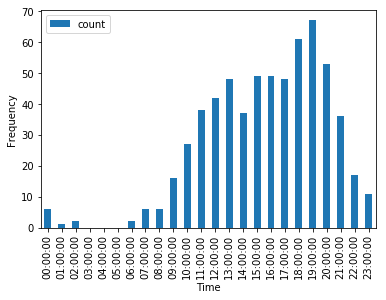

In [42]:
import numpy as np
import matplotlib.pyplot as plt
import datetime

traffic_df.plot(x='Time', y='count', kind='bar')
plt.ylabel('Frequency')
plt.show()


# Speed

In [0]:
def getSpeed(lst,path_type):
  
  points_list = lst['nearest_node'].values.tolist()
  time_list = lst['time'].values.tolist()
  route = []
  distance = []
  time = []
  #calculate the shortes route for list of points
  for point1, point2 in zip(points_list[:-1], points_list[1:]):
      orig = point1
      dest = point2
      intermediate_route = nx.shortest_path(G, orig, dest, weight=path_type)
      
      #calculate the distance for one segment based on length on each edge
      leng = 0 #initialize the length
      for point1, point2 in zip(intermediate_route[:-1], intermediate_route[1:]):
       
       leng += G[point1][point2][0]['length']
      
      distance.append(leng)
 
 #time measuring
  for time1, time2 in zip(time_list[:-1], time_list[1:]):
    start = pd.to_datetime(time1)
    end = pd.to_datetime(time2)
    dif = end - start
    time.append(dif.total_seconds()/60)  # conver to minute
     
  #print(time)
  result = []
  for i in range(len(distance)):
    try:        
      v = distance[i]/time[i] 
    except ZeroDivisionError:
      v = -1
    result.append(v)
  result = [item for item in result if item >= 0]

  return result


problem_trips = []

Speed  = df.sort_values(by=['trip_id','time']).groupby('trip_id').apply(getSpeed, 'length')


In [62]:
# Speed is an object. We should convert it to a dataframe
speeds = pd.DataFrame({'trip_id':Speed.index, 'speed':Speed.values})

speeds.head()

,trip_id,speed
0,00066e1e-ae6d-4d23-9fc3-69585c34100b,"[0.0, 31.31465915863458]"
1,0011fa6a-ba9c-4a10-a35d-1be8b961d1e6,"[30.171414329182813, 65.59529173237215, 74.140..."
2,00144b51-4e32-4f53-a8d5-0ce530d58054,"[147.1284352849407, 216.1089714144377, 194.635..."
3,0014c5d9-5b35-4a65-9d41-a755db8b90a5,"[205.16523135308714, 210.9446841813498, 160.66..."
4,001658cc-b108-40f3-9c51-d778f43eb340,"[67.66153698847285, 0.0, 131.16235294117647]"


***Percentage of segments within speed boundaries***

In [63]:
speed_list = [val for sublist in speeds.speed.tolist() for val in sublist]

def count_range_in_list(lst, min, max):
	ctr = 0
	for x in lst:
		if min <= x <= max:
			ctr += 1
	return ctr

print("percentage of segments within speed boundaries: ", count_range_in_list(speed_list, 0, 375)*100/len(speed_list),"%")

percentage of segments within speed boundaries:  88.08961444946162 %


***Shortest path finding algorithm:*** percentage of segments within speed boundaries is 88.1%

***Weigthed length finding algorithm:*** percentage of segments within speed boundaries is 85.32%


***Preferred path finding algorithm:*** percentage of segments within speed boundaries is 85.79%


***Simplified preferred path finding algorithm:*** percentage of segments within speed boundaries is 86.19%

***Corner weighted path finding algorithm:*** percentage of segments within speed boundaries is 86.83%

***Corner weighted length path finding algorithm:*** percentage of segments within speed boundaries is 85.56%


***Unbiased path finding algorithm:*** percentage of segments within speed boundaries is 86.8%


***Closeness centrality path finding algorithm:*** percentage of segments within speed boundaries is 87.8%



**Apply speed boundries and plot the results**

In [0]:
def getGoodSpeeds(lst):
  #print(lst)
  v = lst['speed']
  if len(v) > 1 and min(v) > 0 and max(v) <= 375:
    goodSpeeds.extend(v)

goodSpeeds = []
b = speeds.apply(getGoodSpeeds,axis=1)


In [0]:
#create a dataframe and convert speed to Km/h
speeds = pd.DataFrame({'speed':goodSpeeds})
speeds['speed']= speeds['speed'].apply(lambda x:x*60/1000)

In [66]:
speeds.speed.describe()

count    12450.000000
mean         7.474685
std          5.205527
min          0.007732
25%          3.166290
50%          6.646786
75%         10.954165
max         22.486929
Name: speed, dtype: float64

Text(0.5, 0, 'Speed (Km/h)')

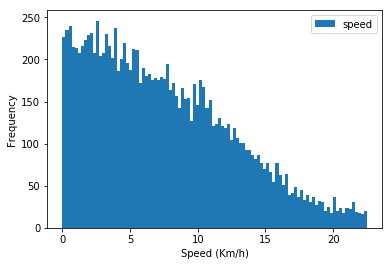

In [74]:
speeds.plot.hist(bins = 100)
plt.xlabel('Speed (Km/h)')


Text(0, 0.5, 'Km/h')

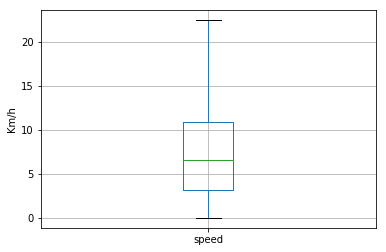

In [78]:
speeds.boxplot(column=['speed'])
plt.ylabel('Km/h')


Text(0, 0.5, 'Km/h')

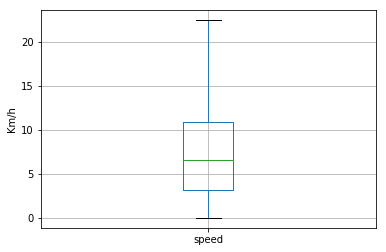

In [79]:
# With outliers removed

boxplot = speeds.boxplot(column=['speed'], showcaps=True, showfliers=False)
plt.ylabel('Km/h')


**Look at the trips that all segments are in the speed boundaries**

In [80]:
# Speed is an object. We should convert it to a dataframe
speeds = pd.DataFrame({'trip_id':Speed.index, 'speed':Speed.values})

speeds.head()

,trip_id,speed
0,00066e1e-ae6d-4d23-9fc3-69585c34100b,"[0.0, 31.31465915863458]"
1,0011fa6a-ba9c-4a10-a35d-1be8b961d1e6,"[30.171414329182813, 65.59529173237215, 74.140..."
2,00144b51-4e32-4f53-a8d5-0ce530d58054,"[147.1284352849407, 216.1089714144377, 194.635..."
3,0014c5d9-5b35-4a65-9d41-a755db8b90a5,"[205.16523135308714, 210.9446841813498, 160.66..."
4,001658cc-b108-40f3-9c51-d778f43eb340,"[67.66153698847285, 0.0, 131.16235294117647]"


In [0]:
from statistics import mean, median


def getGoodTrips(lst):
  #print(lst)
  v = lst['speed']
  if len(v) > 1 and min(v) > 0 and max(v) <= 375:
    goodTrips.append(lst.name)

goodTrips = []
a = speeds.apply(getGoodTrips,axis=1)


In [82]:
len(goodTrips)

2636

In [0]:
good_trips = speeds.loc[goodTrips]

In [84]:
good_trips.head()

,trip_id,speed
3,0014c5d9-5b35-4a65-9d41-a755db8b90a5,"[205.16523135308714, 210.9446841813498, 160.66..."
6,0023ff4a-b7f9-4332-b222-af500c92eb42,"[75.48818991097924, 191.84031661361095, 124.93..."
7,002ebc94-9d20-4786-ac5d-452405927a06,"[67.13058743791736, 163.82714285714286]"
9,003c2154-6d38-48e7-8aed-b5b53869e1bf,"[61.77370689655172, 44.90150943396227, 17.0025..."
14,005e9b97-3840-4842-9a26-fa70eb188568,"[206.23556675062974, 19.110096761416152]"
